## ECS7017P Lab 1
# Visualising Player Deaths in *PUBG: Battlegrounds*

In this week’s lab you will use this [Jupyter Notebook](https://docs.jupyter.org/en/latest/) to create Python visualisations of a player death dataset from the Battle Royale game *PUBG: Battlegrounds*. A notebook is a series of editable cells, containing either Python code (Code cells) or formatted text (Markdown cells). This notebook was written for [Google Colab](https://colab.research.google.com/) - but it could be run on another cloud service (like [Binder](https://mybinder.org/)) or [locally](https://jupyter.org/install).

### Exercises

The exercises in this lab are assessed, as part of the first coursework in this module. There are 25 marks available.
* Exercise 1 involves making a simple scatter plot of player death locations. (3 points)
* Exercise 2 requires you to create a heatmap of the same data. (3 points)
* Exercise 3 breaks down the dataset by weapon type, and asks you to compare these deaths using
heatmaps. (5 points)
* Exercise 4 looks at how kill distance varies across the map. (6 points)
* Exercise 5 involves creating a balance heatmap comparing deaths versus kills. (8 points)

### Submitting Your Work

Save/download a copy of the notebook and include that **ipynb file** in your ZIP file submission for Coursework 1. That file should include all your lab work, i.e. any code/text you've added, and images you generated.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cmap

%matplotlib inline
plt.rcParams["figure.figsize"] = (10,10)
! mkdir maps

# Accessing Kaggle

The [PUBG Match Deaths and Statistics dataset](https://www.kaggle.com/skihikingkevin/pubg-match-deaths) is available
on [Kaggle](https://www.kaggle.com/).

Accessing Kaggle on Google Colab (other Jupyter platforms may not require this): register for a free Kaggle account and generate an API token. On the Kaggle website, under Account / API, select ”Create New API Token” and download the resulting token file kaggle.json. View the notebook files (folder on the left sidebar) and upload the token file.

You can now configure the notebook to access your Kaggle account:

In [5]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


# Download the Dataset

Download and unzip the PUBG dataset:

In [6]:
! kaggle datasets download skihikingkevin/pubg-match-deaths
! unzip pubg-match-deaths.zip

Dataset URL: https://www.kaggle.com/datasets/skihikingkevin/pubg-match-deaths
License(s): CC0-1.0
100% 4.08G/4.10G [00:44<00:00, 62.3MB/s]
100% 4.10G/4.10G [00:44<00:00, 98.6MB/s]
Archive:  pubg-match-deaths.zip
  inflating: aggregate/agg_match_stats_0.csv  
  inflating: aggregate/agg_match_stats_1.csv  
  inflating: aggregate/agg_match_stats_2.csv  
  inflating: aggregate/agg_match_stats_3.csv  
  inflating: aggregate/agg_match_stats_4.csv  
  inflating: deaths/kill_match_stats_final_0.csv  
  inflating: deaths/kill_match_stats_final_1.csv  
  inflating: deaths/kill_match_stats_final_2.csv  
  inflating: deaths/kill_match_stats_final_3.csv  
  inflating: deaths/kill_match_stats_final_4.csv  
  inflating: erangel.jpg             
  inflating: miramar.jpg             


This should take about 5 minutes. Use the time to read up on the [pandas library](https://pandas.pydata.org/pandas-docs/stable/user_guide/10min.html). And if you don’t know *PUBG: Battlegrounds* then you should familiarise yourself with the basic gameplay ([Wikipedia](https://en.wikipedia.org/wiki/PUBG:_Battlegrounds#Gameplay), [YouTube](https://www.youtube.com/watch?v=lsXMumRLo6I)).


# The PUBG Dataset

Import the Erangel map that comes with the dataset:

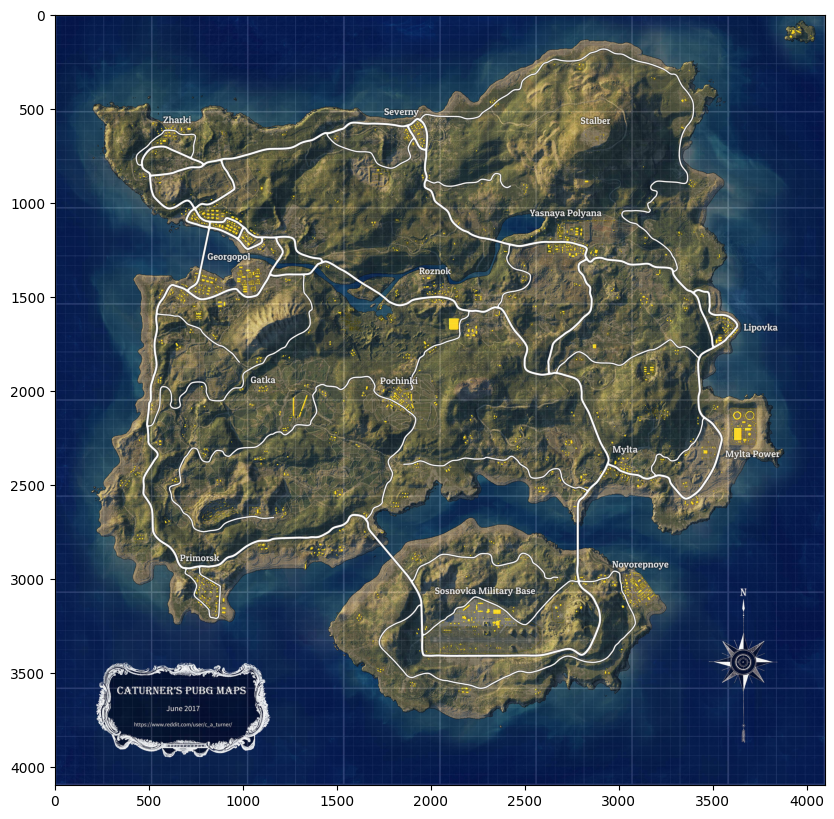

In [8]:
map_img = plt.imread('erangel.jpg')
plt.imshow(map_img)

The player death data is in five CSV files, each with log data on 13 million deaths. For this lab, we will just
use one file:


In [9]:
deaths = pd.read_csv("deaths/kill_match_stats_final_0.csv")
len(deaths)

13426348

This imports the CSV data into a pandas dataframe. Check this [short introduction](https://pandas.pydata.org/pandas-docs/stable/user_guide/10min.html) if you are not familiar
with the pandas library. Use head to view the first few rows of the dataframe. Use len(deaths.index) to view
the total number of rows. Each row records a death, with records coordinates of the victim and of their killer.
Valid x and y coordinates should be between 0 to 800,000.

# Data Preparation

For this lab, we are only interested in a subset of the data:
* deaths on the Erangel map;
* deaths with complete data;
* deaths within the map boundaries.

Let's filter out the unwanted data.

In [10]:
# Only the Erangel map
deaths = deaths[deaths["map"] == "ERANGEL"]
# Only rows with missing data
deaths = deaths.dropna()
# Only within map boundaries
max_xy = 800000
deaths = deaths[deaths['victim_position_x'] < max_xy]
deaths = deaths[deaths['victim_position_y'] < max_xy]

Now check how many rows are left in the deaths dataframe.

In [11]:
len(deaths)

9928791

Now remove rows where the killer’s position was outside the map boundary. How many rows remain?

In [12]:
# Add your code to filter by killer position
deaths = deaths[deaths['killer_position_x'] < max_xy]
deaths = deaths[deaths['killer_position_y'] < max_xy]
len(deaths)

9928791

This is still far more data than we need to create our visualisations, so we take a sample of N deaths to work with. Set N to a value between 100k and 800k. You can adjust your sample size later on if needed, to help with the visualisation.

In [17]:
N = 200000
sample = deaths.head(N)

# Player Deaths Scatterplot

Now visualise the player deaths as a scatterplot on top of the map.

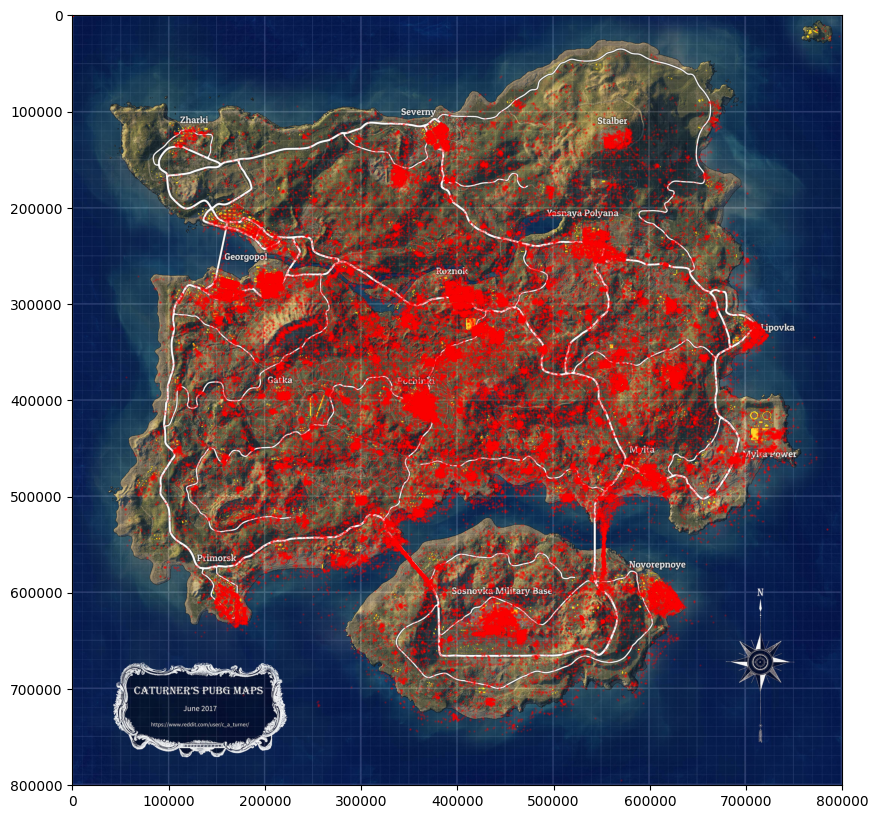

In [27]:
fig, ax = plt.subplots()
#ax.set_ylim(800000,0)
#ax.set_xlim(0,800000)
ax.imshow(map_img,extent=[0,max_xy,max_xy,0])
ax.scatter(sample["victim_position_x"], sample["victim_position_y"], s=0.5, alpha=0.2, color="red")

# Exercise 1: Player Death Scatterplot

You can adjust your plot using the following parameters on scatter:
* s: point area.
* alpha: transparency, between 0.0 and 1.0.
* color: plot color, e.g. ”red”.
  
Adjust the plot above to create a good visualisation of player death locations. Both the map and the data should be visible. Explain your choices.

**Your answer:** ..

Set s=0.5 as smaller point prevents overlap

Set alpha=0.2 to make points more apparent, the map remains visiable

Set color="red" to enhance contrast between death locations and the background

# Player Deaths Heatmap

### Heatmap code

In [61]:
killer_loc = ['killer_position_x','killer_position_y']
victim_loc = ['victim_position_x','victim_position_y']
pd.set_option('mode.chained_assignment', None)

# The hm cells function counts the number of deaths in each heatmap cell
def hm_cells(df, n, cols=victim_loc):
    cell_size = max_xy / n
    cells = np.zeros(shape=(n,n), dtype=int)
    for index, row in df.iterrows():
        x = int(row[cols[0]] // cell_size)
        y = int(row[cols[1]] // cell_size)
        cells[y,x] = cells[y,x] + 1
    return cells

# The heatmap function plots this cell data on top of the map
def heatmap(cells, n, log=False, showMap=True, alpha=0.5):
    if (log):
        np.seterr(divide = 'ignore')
        cells = np.log2(cells)
        cells[np.isneginf(cells)] = 0

    hm_fig, hm_ax = plt.subplots()
    hm_ax.set_ylim(n, 0)
    hm_ax.set_xlim(0, n)
    if (showMap):
        hm_ax.imshow(map_img, extent=[0,n,n,0])
    hm_ax.imshow(cells, alpha=alpha, cmap=cmap.hot)
    return hm_fig

### Create a heatmap

Next we make a heatmap with MxM cells, for some sensible M. The aim of any visualisation is to clearly communicate something about a
dataset to the viewer. In this case, we want to show where players have died. We will need to choose appropriate parameters to make this
clear.

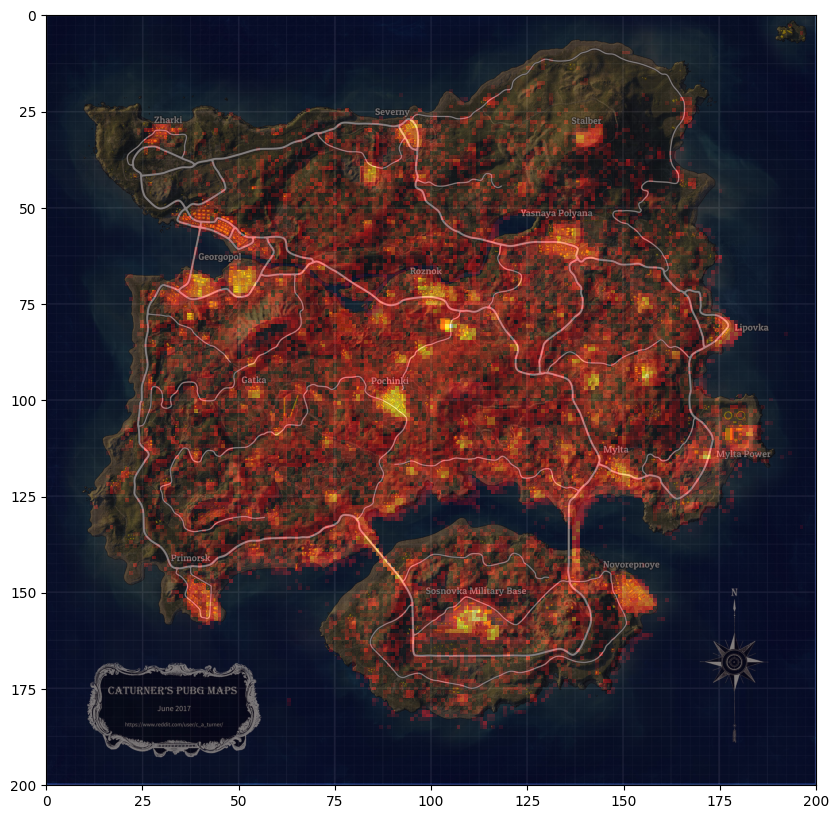

In [64]:
# Edit this code to change the visualisation
M = 200 # this value is too small
fig = heatmap(hm_cells(sample, M), M, log=True)

# Exercise 2: Deaths Heatmap

Experiment with the cell, log and alpha parameters above until you have a good heatmap visualisation of player deaths. Explain in words why you chose these specific parameters.

**Your answer**:

log=True making heatmap more average, making low-density areas more visible

alpha=0.5 to clearly see both heatmap and background

M=200; higer M provides better resolution

# Visualising Weapon Types

Next you will look at how diﬀerent kinds of weapon (or other causes of death) vary across the map. Let’s group
the weapons into a few distinct types to help with this analysis.

In [52]:
rifles = ['AKM', 'M416', 'SCAR-L', 'M16A4', 'Groza', 'AUG', 'SKS', 'Mini 14', 'VSS', 'Mk14']
shotguns = ['S1897', 'S12K', 'S686']
explosives = ['Grenade', 'death.ProjMolotov_DamageField_C', 'death.ProjMolotov_C']
pistols = ['P92', 'P1911', 'R1895' 'P18C']
snipers = ['Kar98k', 'M24', 'AWM', 'Crossbow']
melee = ['Pan', 'Sickle', 'Crowbar', 'Machete', 'Punch', 'Pan']
submg = ['Micro UZI', 'Tommy Gun', 'UMP9', 'Vector', 'VSS']
mg = ['M249', 'DP-28']
vehicles = ['Uaz', 'Motorbike (SideCar)', 'Hit by Car', 'Buggy', 'Dacia', 'Motorbike',
'Boat', 'Aquarail']

# Exercise 3: Deaths by Weapon Heatmaps

Write a function `label_weapon(row)` which takes a dataframe row as input and returns a string
label based on `row['killed by']`. Use this to add a new column to your sample data:

`sample['WeaponType'] = sample.apply(label_weapon, axis=1)`

Create heatmaps to compare some of these weapon types. Explain in words what diﬀerences you observe between death by these weapons
and why you think they might be diﬀerent.

In [65]:
# Your code (you may use multiple cells)
def label_weapon(row):
    if row['killed_by'] in rifles:
        return 'Rifle'
    if row['killed_by'] in shotguns:
        return 'Shotgun'
    if row['killed_by'] in explosives:
        return 'Explosive'
    if row['killed_by'] in pistols:
        return 'Pistol'
    if row['killed_by'] in snipers:
        return 'Sniper'
    if row['killed_by'] in melee:
        return 'Melee'
    if row['killed_by'] in submg:
        return 'Submachine Gun'
    if row['killed_by'] in mg:
        return 'Machine Gun'
    if row['killed_by'] in vehicles:
        return 'Vehicle'
sample['WeaponType'] = sample.apply(label_weapon, axis=1)

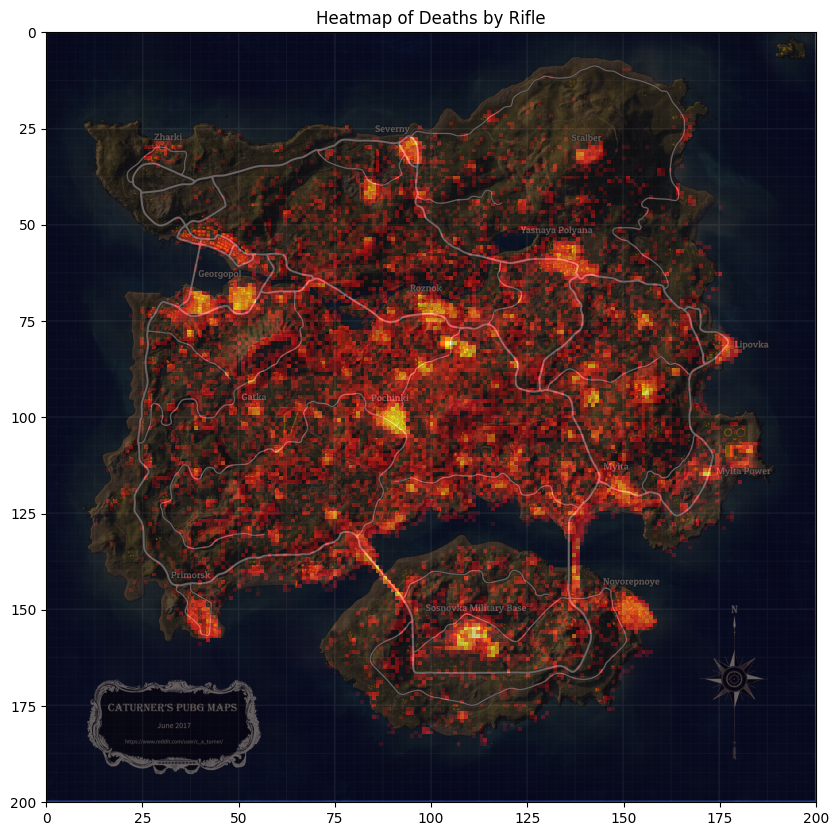

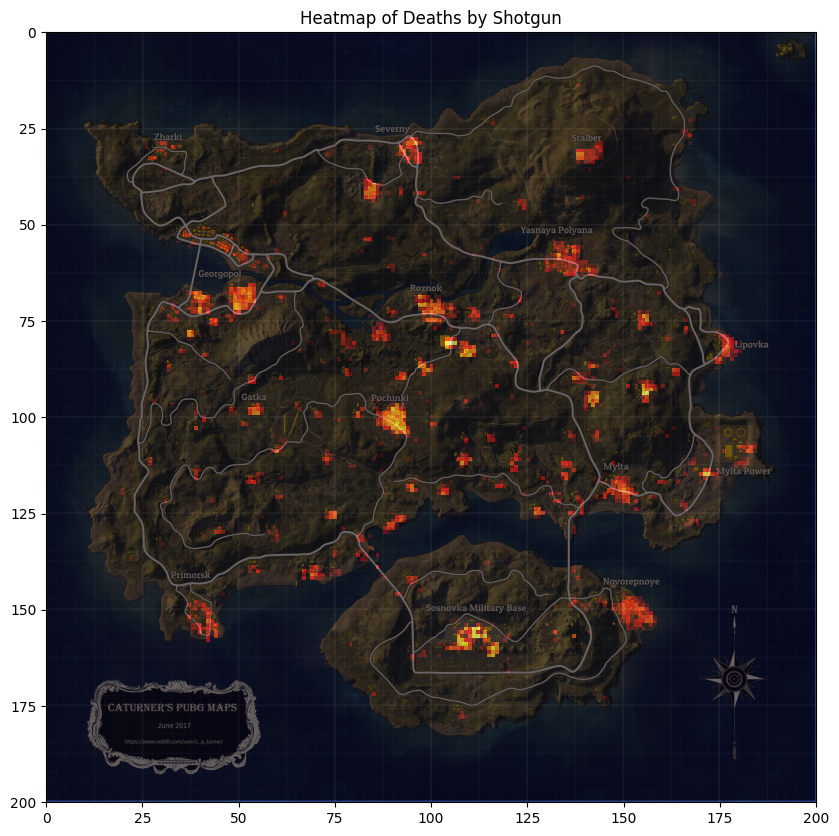

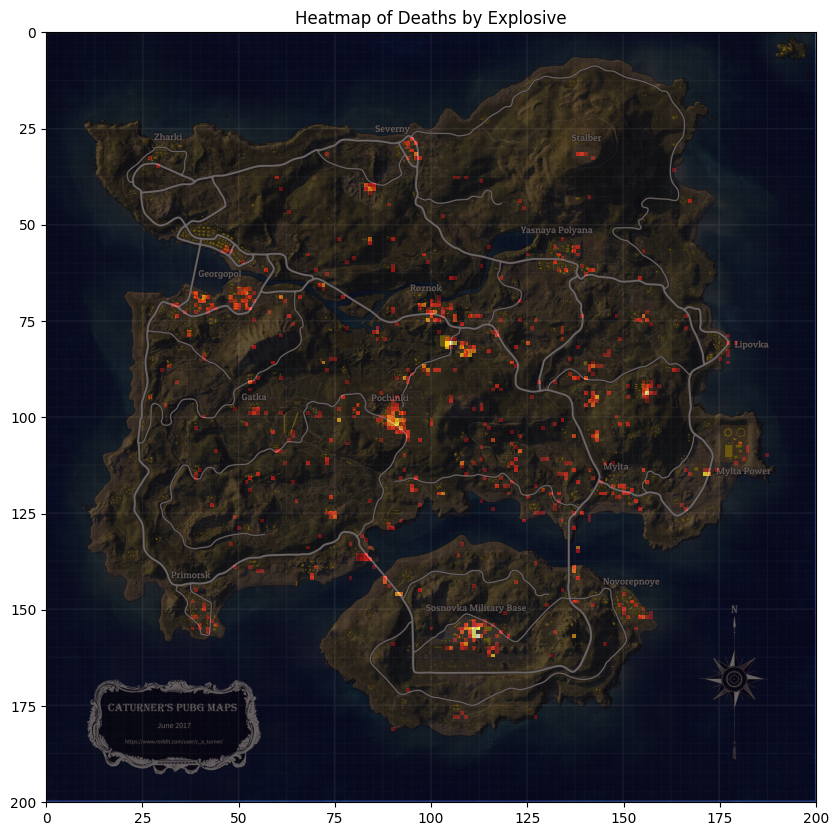

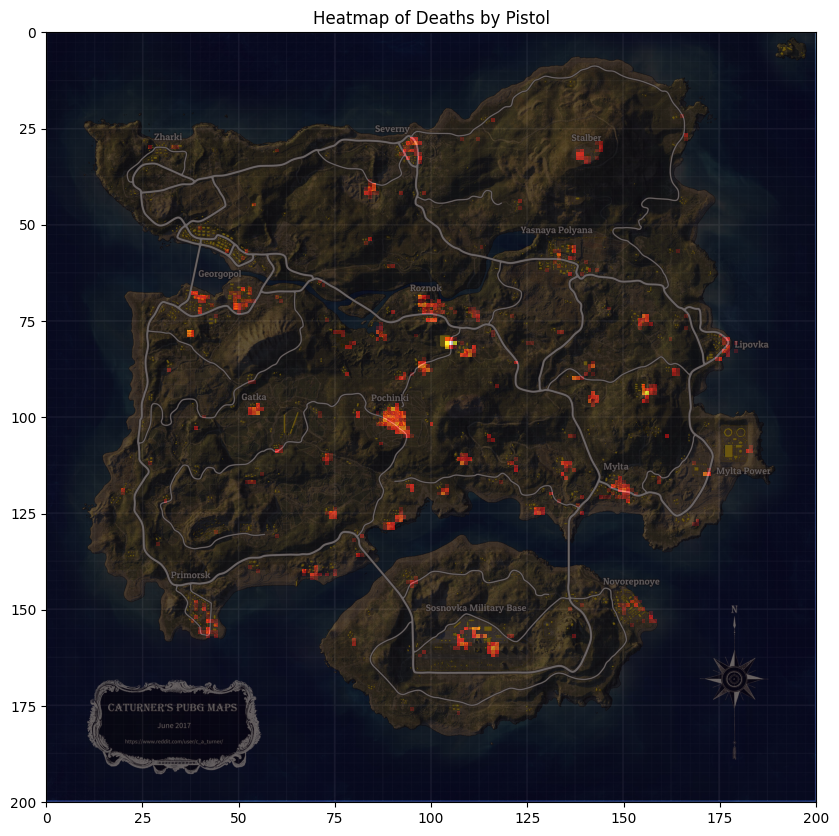

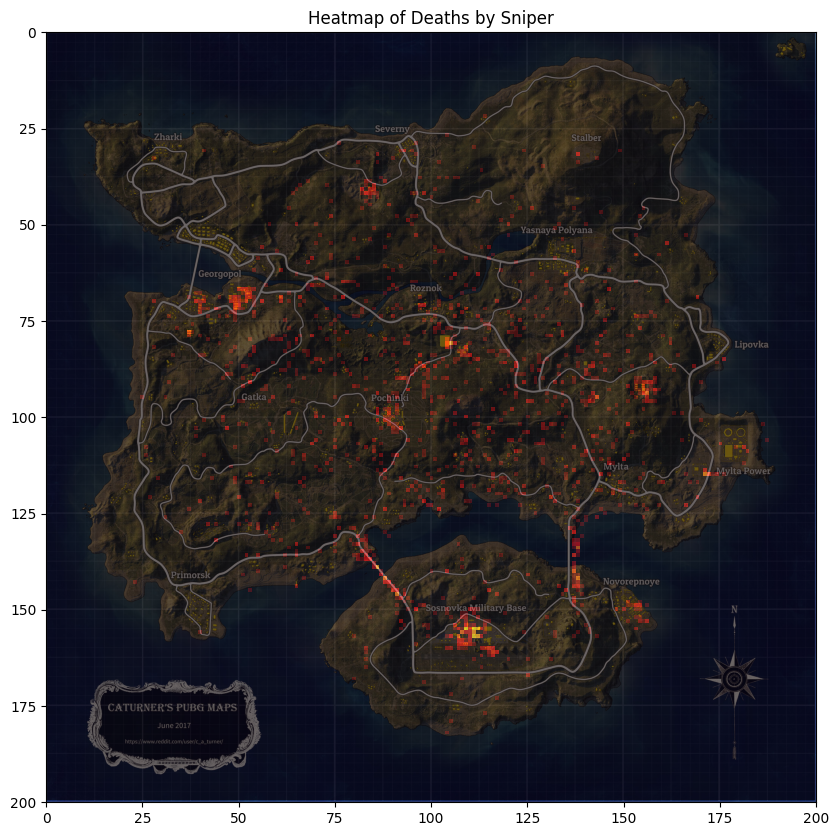

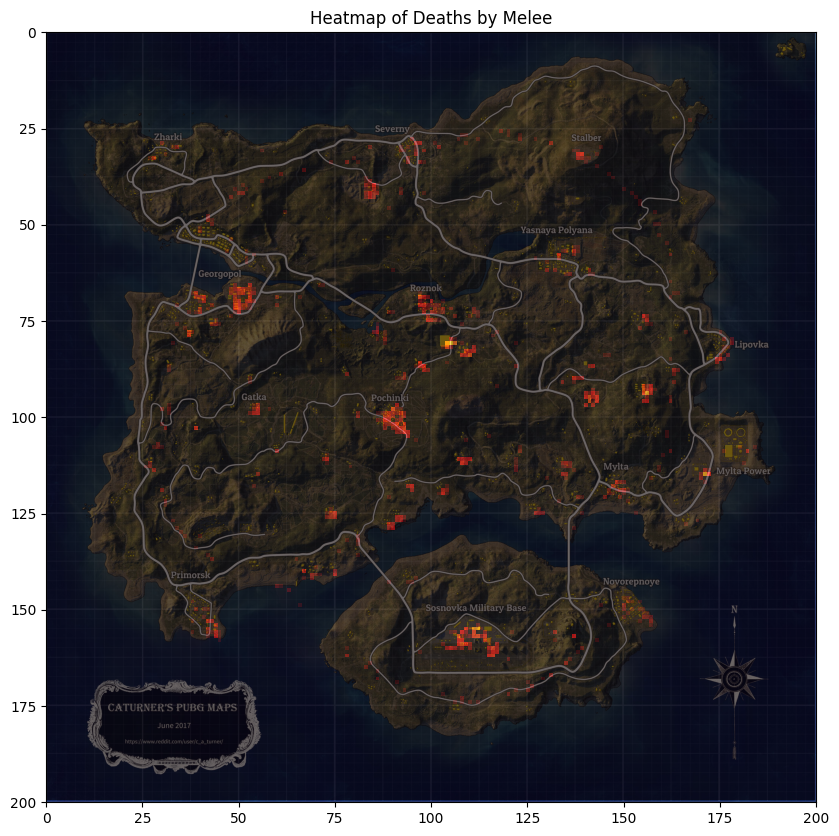

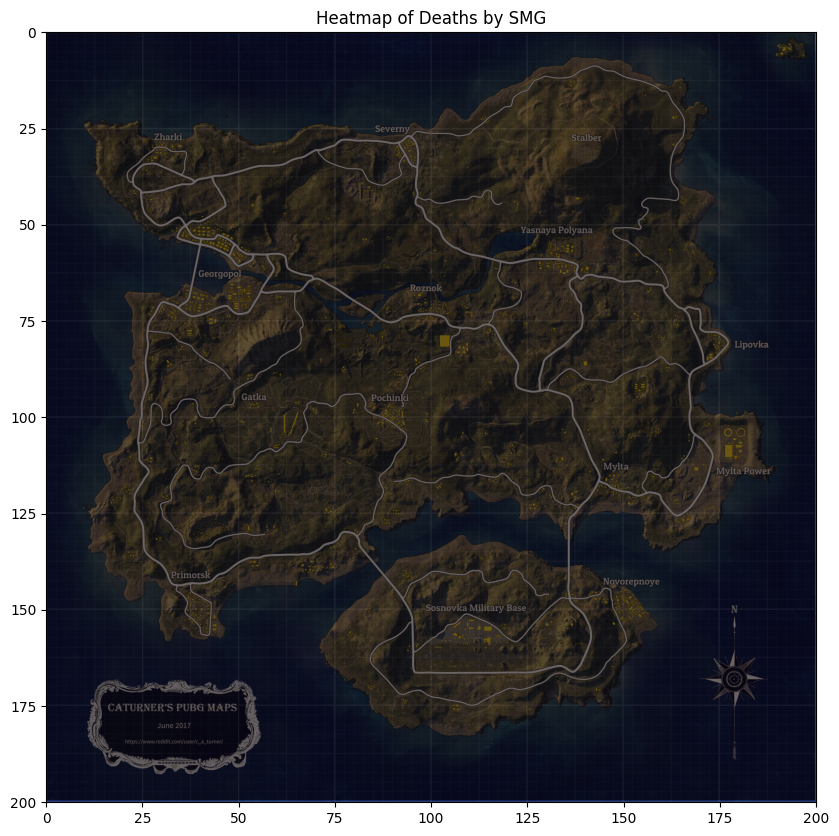

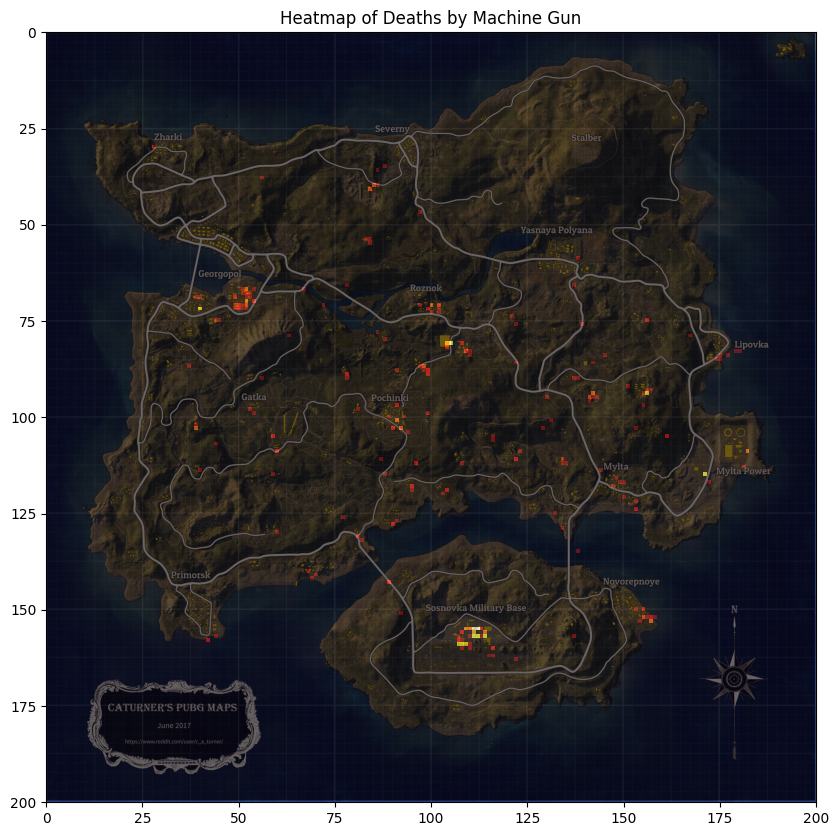

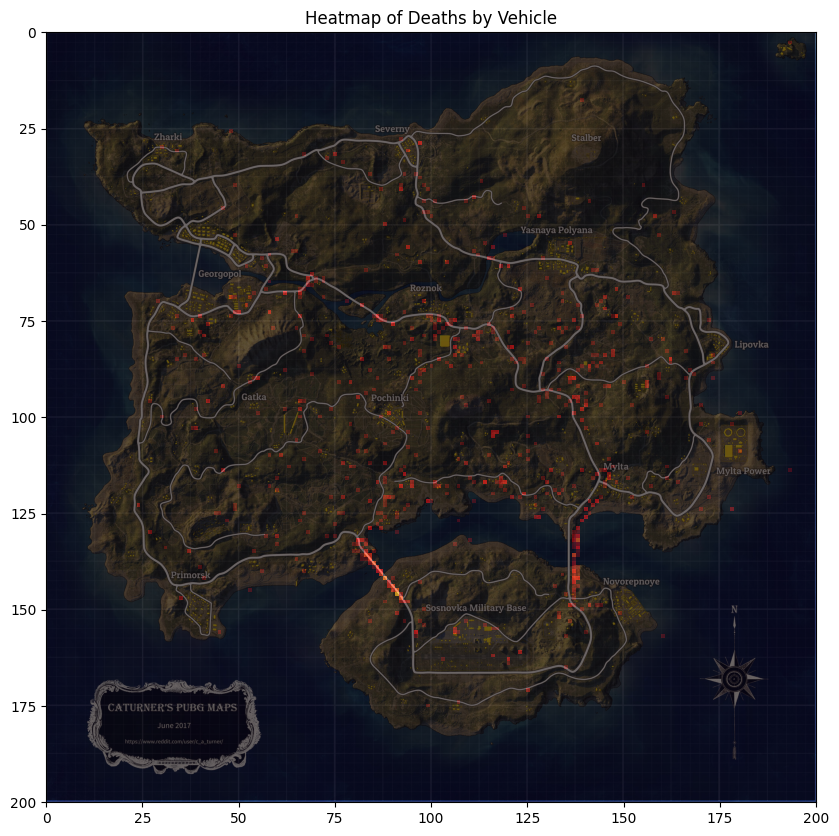

In [72]:
weapon_types = ["Rifle", "Shotgun", "Explosive", "Pistol", "Sniper", "Melee", "SMG", "Machine Gun", "Vehicle"]
for weapon in weapon_types:
    filtered_sample = sample[sample["WeaponType"] == weapon]
    fig = heatmap(hm_cells(filtered_sample, M), M, log=True, alpha= 0.6)
    plt.title(f"Heatmap of Deaths by {weapon}")
    plt.show()

**Your answer:** ...

Rifle: deaths are widely spreaded; as rifle is useful in various situations

Shotgun: deaths mostly centered in urban areas because shotguns have a relatively short effective range, making them more effective in city environments

Explosive: deaths mostly also centered in urban areas as Explosive are often used to clear enemies in buildings

Pistol: deaths centered in early-game hotspots like Pochinki, Georgopol, and Roznok. Pistols are mostly used in early game stage and their landing space

Sniper: deaths are also widely spreaded, but mostly in open areas, cities and bridges. people get killed when they tried to enter a town or cross a bridge

Melee: deaths are limited in early game landing spots such as Pochinki, Georgopol, as melee are used in early stage when people don't have a gun

SMG: can't be seen on the map, probably no death data

Machine Gun: death are rare, mainly in Sosnovka Military Base, Georgopol, and Pochinki, maybe the reason is Machine Gun is rare weapon and can only be got in late stage of the game and special places

Vehicle: Death by vehicles mainly centered on roads and bridges as people get killed when they crossing roads

# Exercise 4: Visualising Kill Distance

Add a new column distance to your sample data, defined by the straight line distance between the victim’s and the killer’s locations. You can use np.sqrt and np.square.

Write a modified version of `hm_cells` which sums the total distance values for each cell. Divide these by the death count for each cell to get the average death distance for each cell. Visualise this as a heatmap. Explain in words what patterns you observe, if any.

In [73]:
# Your code (you may use multiple cells)
sample['distance'] = np.sqrt(np.square(sample['victim_position_x'] - sample['killer_position_x']) + np.square(sample['victim_position_y'] - sample['killer_position_y']))

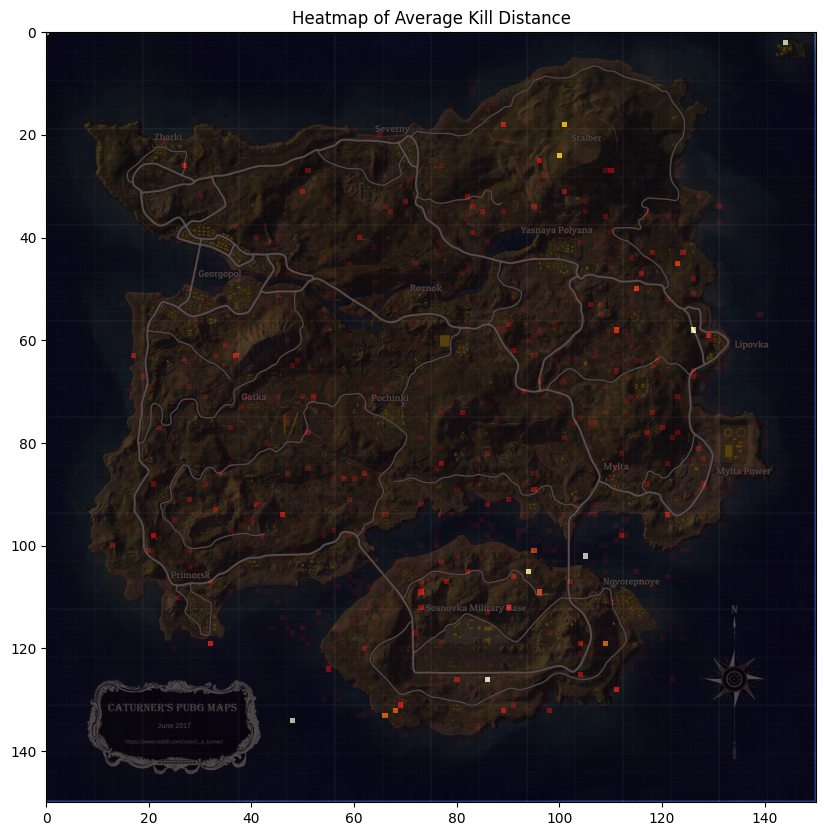

In [107]:
# The hm cells function counts the distance of deaths in each heatmap cell
def hm_cells_avg_distance(df, n, cols=["victim_position_x", "victim_position_y", "distance"]):
    cell_size = max_xy / n

    distance_sum = np.zeros((n, n), dtype=float)
    count = np.zeros((n, n), dtype=int)

    for _, row in df.iterrows():
        x = int(row[cols[0]] // cell_size)
        y = int(row[cols[1]] // cell_size)
        if 0 <= x < n and 0 <= y < n:
            distance_sum[y, x] += row[cols[2]]
            count[y, x] += 1

    avg_distance = np.divide(distance_sum, count, where=(count > 0))
    avg_distance[count == 0] = 0
    return avg_distance
cells = hm_cells_avg_distance(sample, 150)
fig = heatmap(cells, 150, alpha=0.7)
plt.title("Heatmap of Average Kill Distance")
plt.show()

**Your answer**: ...
when we apply log=True, almost the whole map turns yellow, that's because most avg_distance is small, only a few points have a high kill distance. So set log=False


# Exercise 5: Balance Heatmaps

Create a heatmap which visualises the diﬀerence between killers and victims across the island, in a similar fashion to the balance maps developed for War on Cybertron (see lecture on Visualisation). Explain in words what patterns you observe, if any.

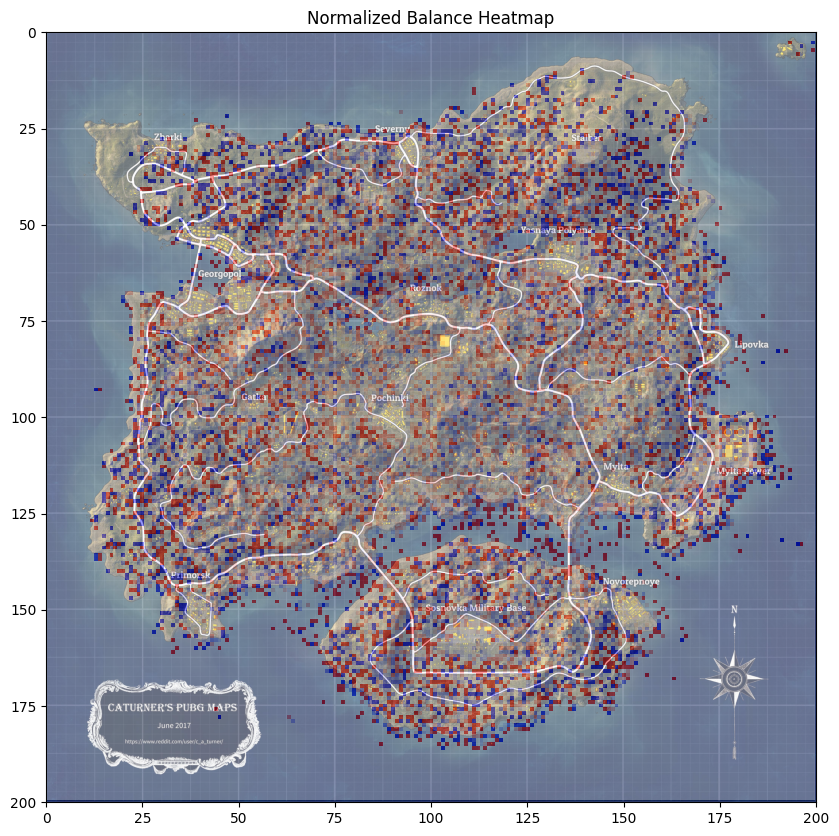

In [120]:
# Your code (you may use multiple cells)
kill_grid = hm_cells(sample, M, killer_loc)
death_grid = hm_cells(sample, M, victim_loc)

def normalized_balance_heatmap(kill_grid, death_grid, n, showMap=True, alpha=0.5):
    balance_grid = (death_grid - kill_grid) / (kill_grid + death_grid + 1e-5)
    hm_fig, hm_ax = plt.subplots()
    hm_ax.set_ylim(n, 0)
    hm_ax.set_xlim(0, n)
    if (showMap):
        hm_ax.imshow(map_img, extent=[0,n,n,0])
    im = hm_ax.imshow(balance_grid, alpha=alpha, cmap=cmap.bwr, vmin=-1, vmax=1)
    return hm_fig


fig = normalized_balance_heatmap(kill_grid, death_grid, M, alpha=0.4)
plt.title("Normalized Balance Heatmap")
plt.show()

**Your answer**: ...

Red means more death, blue means more kills

Balance Heatmap is widely distributed in the whole map, which means battle happens at almost everywhere of the map.
For open space like bridges and roads, there are more kills as people lacks cover
For popular landing cities like Pochinki, Georgopol, and Roznok, the number of kills is basically equal to deaths


# Submission Reminder

Your single ZIP file submission should include a modified copy of this notebook (a .ipynb file) documenting your lab work.